In [2]:
import sys
!{sys.executable} -m pip install astropy
from astropy.table import Table
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as scipy
from scipy import optimize
np.set_printoptions(threshold=np.inf)
np.set_printoptions(precision = 40, suppress = True) #prevents scientific notation for 40 character numbers

In [20]:
from astropy.io import fits
from astropy.table import Table

GSample = fits.open('/Users/edm/Desktop/100pc_rvnotnull.fits')
GSample_A = Table(GSample[1].data)

In [22]:
GSample_A

source_id,designation,ra,dec,l,b,ecl_lon,ecl_lat,parallax,pmra,pmdec,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,ra_error,dec_error,parallax_error,pmra_error,pmdec_error,ruwe,ag_gspphot,ag_gspphot_lower,ag_gspphot_upper,astrometric_chi2_al,astrometric_excess_noise,astrometric_excess_noise_sig,astrometric_gof_al,astrometric_matched_transits,astrometric_n_bad_obs_al,astrometric_n_good_obs_al,astrometric_n_obs_ac,astrometric_n_obs_al,astrometric_params_solved,astrometric_primary_flag,astrometric_sigma5d_max,azero_gspphot,azero_gspphot_lower,azero_gspphot_upper,bp_g,bp_rp,classprob_dsc_combmod_galaxy,classprob_dsc_combmod_quasar,classprob_dsc_combmod_star,dec_parallax_corr,dec_pmdec_corr,dec_pmra_corr,dec_pseudocolour_corr,distance_gspphot,distance_gspphot_lower,distance_gspphot_upper,duplicated_source,ebpminrp_gspphot,ebpminrp_gspphot_lower,ebpminrp_gspphot_upper,g_rp,grvs_mag,grvs_mag_error,grvs_mag_nb_transits,has_epoch_photometry,has_epoch_rv,has_mcmc_gspphot,has_mcmc_msc,has_rvs,has_xp_continuous,has_xp_sampled,in_andromeda_survey,in_galaxy_candidates,in_qso_candidates,ipd_frac_multi_peak,ipd_frac_odd_win,ipd_gof_harmonic_amplitude,ipd_gof_harmonic_phase,libname_gspphot,logg_gspphot,logg_gspphot_lower,logg_gspphot_upper,matched_transits,matched_transits_removed,mh_gspphot,mh_gspphot_lower,mh_gspphot_upper,new_matched_transits,non_single_star,nu_eff_used_in_astrometry,parallax_over_error,parallax_pmdec_corr,parallax_pmra_corr,parallax_pseudocolour_corr,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_bp_mean_flux_over_error,phot_bp_n_blended_transits,phot_bp_n_contaminated_transits,phot_bp_n_obs,phot_bp_rp_excess_factor,phot_g_mean_flux,phot_g_mean_flux_error,phot_g_mean_flux_over_error,phot_g_n_obs,phot_proc_mode,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_flux_over_error,phot_rp_n_blended_transits,phot_rp_n_contaminated_transits,phot_rp_n_obs,phot_variable_flag,pm,pmdec_pseudocolour_corr,pmra_pmdec_corr,pmra_pseudocolour_corr,pseudocolour,pseudocolour_error,ra_dec_corr,radial_velocity,radial_velocity_error,random_index,ra_parallax_corr,ra_pmdec_corr,ra_pmra_corr,ra_pseudocolour_corr,ref_epoch,rv_amplitude_robust,rv_atm_param_origin,rv_chisq_pvalue,rv_expected_sig_to_noise,rv_method_used,rv_nb_deblended_transits,rv_nb_transits,rv_renormalised_gof,rvs_spec_sig_to_noise,rv_template_fe_h,rv_template_logg,rv_template_teff,rv_time_duration,rv_visibility_periods_used,scan_direction_mean_k1,scan_direction_mean_k2,scan_direction_mean_k3,scan_direction_mean_k4,scan_direction_strength_k1,scan_direction_strength_k2,scan_direction_strength_k3,scan_direction_strength_k4,solution_id,teff_gspphot,teff_gspphot_lower,teff_gspphot_upper,vbroad,vbroad_error,vbroad_nb_transits,visibility_periods_used
int64,str28,float64,float64,float64,float64,float64,float64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,int16,int16,int16,int16,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,float32,float32,float32,float32,float32,float32,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,int16,float32,float32,str7,float32,float32,float32,int16,int16,float32,float32,float32,int16,int16,float32,float32,float32,float32,float32,float64,float32,float32,int16,int16,int16,float32,float64,float32,float32,int16,int16,float64,float32,float32,int16,int16,int16,str13,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,float32,float32,float32,float32,float64,float32,int16,float32,float32,int16,int16,int16,float32,float32,float32,float32,float32,float32,int16,float32,float32,float32,float32,float32,float32,float32,float32,int64,float32,float32,float32,float32,float32,int16,int16
4274742093156324992,Gaia DR3 4274742093156324992,275.0327275772723,0.37370548269282566,29.679904499565314,7.132736882640082,275.498

In [24]:
#radial velocity
Rvel = np.asarray(GSample_A["radial_velocity"])
#print(Rvel)
#median x velocity
PMD = np.asarray(GSample_A['pmdec'])
#print(PMD)
#proper motion RA
PMR = np.asarray(GSample_A['pmra'])
pmtot = np.sqrt(PMR**2+PMD**2)
#parallax
plx = np.asarray(GSample_A['parallax'])
#median distanc
#print(Rp)
Bp_Rp = np.asarray(GSample_A['bp_rp'])
#print(Bp)
vtan = (4.74/plx)*pmtot
vtot = (np.sqrt(vtan**2+Rvel**2))
c1 = 0.9779*10**9
c2 = 4.74047


In [25]:
def value(s):
    try:
        return float(s)
    except ValueError:
        return 0

In [26]:
data = np.loadtxt('/Users/edm/Desktop/Gaia Data/EEM_dwarf_UBVIJHK_colors_Teff.txt', usecols=(11), comments='#', dtype='str',  converters={11: value})
#does not print with ... so hd to replace with 0's

In [27]:
data = data.astype('float64')

In [28]:
print(data)
len(data)

[ 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.    -0.12  -0.087 -0.037  0.005  0.068  0.11
  0.166  0.194  0.222  0.263  0.32   0.327  0.377  0.434  0.49   0.518
  0.546  0.587  0.64   0.67   0.694  0.719  0.767  0.784  0.803  0.823
  0.832  0.841  0.85   0.869  0.88   0.9    0.95   0.983  1.01   1.1
  1.21   1.34   1.43   1.53   1.7    1.73   1.79   1.84   1.97   2.09
  2.13   2.23   2.39   2.5    2.78   2.94   3.16   3.35   3.71   4.16
  4.5    4.65   4.72   4.86   5.1    4.78   4.86   0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.     0.     0.     0.     0.     0.     0.     0.   ]


118

In [29]:
def value2(s2):
    try:
        return float(s2)
    except ValueError:
        return 0

In [30]:
data2 = np.loadtxt('/Users/edm/Desktop/Gaia Data/EEM_dwarf_UBVIJHK_colors_Teff.txt',usecols=(30), comments='#',dtype='str',  converters={30: value2})


In [31]:
data2 = data2.astype('float64')
data21 = np.asarray(data2)
data11 = np.asarray(data)
new_data = data21[6 : 69]
print(new_data)
len(new_data)

new_data2 = data11[24 : 87]
print(new_data2)
len(new_data2)

[27.    25.    23.    21.3   19.8   18.5   17.7   15.    11.    10.
  7.3    6.     5.4    5.1    4.7    4.3    3.92   3.38   2.75   2.68
  2.18   2.05   1.98   1.86   1.93   1.88   1.83   1.77   1.81   1.75
  1.61   1.5    1.46   1.44   1.38   1.33   1.25   1.21   1.18   1.13
  1.08   1.06   1.03   1.     0.99   0.985  0.98   0.97   0.95   0.94
  0.9    0.88   0.86   0.82   0.78   0.73   0.7    0.69   0.64   0.62
  0.59   0.57   0.54 ]
[-0.12  -0.087 -0.037  0.005  0.068  0.11   0.166  0.194  0.222  0.263
  0.32   0.327  0.377  0.434  0.49   0.518  0.546  0.587  0.64   0.67
  0.694  0.719  0.767  0.784  0.803  0.823  0.832  0.841  0.85   0.869
  0.88   0.9    0.95   0.983  1.01   1.1    1.21   1.34   1.43   1.53
  1.7    1.73   1.79   1.84   1.97   2.09   2.13   2.23   2.39   2.5
  2.78   2.94   3.16   3.35   3.71   4.16   4.5    4.65   4.72   4.86
  5.1    4.78   4.86 ]


63

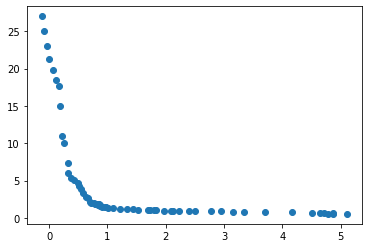

In [32]:
#concatanating 1d arrays code does not iterate over float
scatter = plt.scatter(new_data2,new_data)

In [33]:
def exponential(x, a, k, b):
    return a*np.exp(x*k) + b

In [34]:
popt_exponential, pcov_exponential = scipy.optimize.curve_fit(exponential, new_data2, new_data, p0=[1,-0.5, 1])

In [35]:
perr_exponential = np.sqrt(np.diag(pcov_exponential))
print("pre-exponential factor = %0.2f (+/-) %0.2f" % (popt_exponential[0], perr_exponential[0]))
print("rate constant = %0.2f (+/-) %0.2f" % (popt_exponential[1], perr_exponential[1]))

pre-exponential factor = 20.38 (+/-) 0.46
rate constant = -2.92 (+/-) 0.13


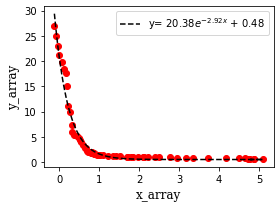

In [36]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import scipy as scipy
from scipy import optimize

from matplotlib import gridspec
import matplotlib.ticker as ticker
%matplotlib inline
fig = plt.figure(figsize=(4,3))
gs = gridspec.GridSpec(1,1)
ax1 = fig.add_subplot(gs[0])

ax1.plot(new_data2, new_data, "ro")
ax1.plot(new_data2, exponential(new_data2, *popt_exponential), 'k--', \
         label="y= %0.2f$e^{%0.2fx}$ + %0.2f" % (popt_exponential[0], popt_exponential[1], popt_exponential[2]))


ax1.set_xlabel("x_array",family="serif",  fontsize=12)
ax1.set_ylabel("y_array",family="serif",  fontsize=12)

ax1.legend(loc='best')



fig.tight_layout()
fig.savefig("fittedExponential.png", format="png",dpi=1000)

In [42]:
#equation to find mass
y = (20.38*np.exp(-2.92*Bp_Rp) + .48)
np.asarray(y)
y

array([ 0.49966642,  0.48638806,  0.49130344,  0.6318339 ,  6.306051  ,
        0.4956155 ,  0.52560705,  0.4874379 ,  0.50205475,  0.48973477,
        0.48492947,  0.5098703 ,  1.6543386 ,  0.587748  ,  2.7075894 ,
        0.48208886,  0.49813575,  0.49514475,  0.49499437,  0.64661175,
        0.53602785,  0.5094986 ,  0.54281646,  0.48872897,  0.55071044,
        0.48937154,  0.51239055,  0.48656234,  3.7389662 ,  0.49845698,
        0.52064836,  0.54700184,  0.49106264,  0.4873709 ,  0.49285588,
        0.48374873,  0.5639026 ,  0.49390984,  0.52505165,  0.5472544 ,
        0.49670517,  0.49272668,  2.731801  ,  1.0383122 ,  0.48089856,
        0.4880595 ,  0.7081305 ,  0.48858428,  0.50130737,  0.5244645 ,
        0.4892775 ,  0.4969435 ,  0.58061224,  0.50285155,  0.4958613 ,
        0.5154254 ,  0.4954334 ,  0.49497142,  0.50851184,  0.48619163,
        0.4953194 ,  0.48833343,  0.4849961 ,  0.48393595,  1.6419629 ,
        0.48247772,  0.4971096 ,  2.7812665 ,  0.53075105,  0.48

In [43]:
t = -c1*(1/plx)*(Rvel/vtot**2)
d = 10**3*(1/plx)*(vtan/vtot)

Text(0, 0.5, 'd/pc')

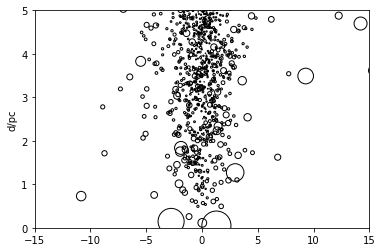

In [44]:
area = (y)/(d*vtot)
plt.scatter(t/10**6, d, s = 1000*area, facecolor = 'none', edgecolor = 'black')

xmin, xmax = plt.xlim(-15,15)
ymin, ymax = plt.ylim(0,5)

#plt.xlabel("t/Myr")
plt.ylabel("d/pc")

In [53]:
f = np.sort(area)

In [54]:
f

array([0.000013474777195575248, 0.000013627265174070705,
       0.000015164158252758595, 0.000015201056725664516,
       0.000015342024338830376, 0.000015901968370352187,
       0.000016319647107505615, 0.000016430067225420126,
       0.00001674948793419596 , 0.00001699324105733694 ,
       0.000017612908406374984, 0.00001777931936076514 ,
       0.000017817069259888568, 0.00001795389288947886 ,
       0.000018662282713686373, 0.000018848696307763896,
       0.00001885680704811317 , 0.00001887398583483705 ,
       0.00001887649976070066 , 0.000018975261925866345,
       0.000019108495601343345, 0.00001915476907035603 ,
       0.000020058365346279722, 0.00002006361318931332 ,
       0.000020373164598184366, 0.000020417094271213633,
       0.000020596471854977004, 0.00002065041469217701 ,
       0.00002078316150479088 , 0.00002082181865035533 ,
       0.000020873818796904446, 0.00002091823344937128 ,
       0.000021036855072965446, 0.000021057478926595958,
       0.00002114671783503691 ,

In [55]:
for i in f:
    print(np.where(area == i))

(array([58517]),)
(array([83856]),)
(array([42740]),)
(array([96484]),)
(array([64715]),)
(array([53637]),)
(array([14654]),)
(array([101522]),)
(array([49195]),)
(array([17527]),)
(array([1583]),)
(array([132066]),)
(array([110770]),)
(array([67626]),)
(array([48510]),)
(array([141410]),)
(array([89997]),)
(array([139937]),)
(array([2014]),)
(array([14552]),)
(array([101247]),)
(array([155285]),)
(array([74339]),)
(array([130751]),)
(array([89862]),)
(array([101169]),)
(array([43247]),)
(array([94311]),)
(array([85204]),)
(array([16472]),)
(array([94485]),)
(array([2631]),)
(array([113967]),)
(array([14784]),)
(array([54074]),)
(array([127674]),)
(array([117927]),)
(array([32271]),)
(array([135221]),)
(array([28340]),)
(array([90117]),)
(array([64216]),)
(array([148084]),)
(array([148574]),)
(array([27112]),)
(array([54847]),)
(array([150753]),)
(array([144846]),)
(array([35070]),)
(array([116091]),)
(array([50621]),)
(array([111040]),)
(array([65162]),)
(array([2747]),)
(array([9770]

In [62]:
max(area)

0.8456904538129305

In [63]:
np.argmax(area)

83

Text(0, 0.5, 'perihelion distance ($d^{med}_{ph}$/pc)')

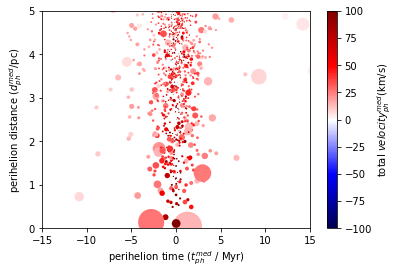

In [58]:
import matplotlib.pyplot as plt 
area = (y)/(d*vtot)
plt.scatter(t/10**6, d, s = 1000*area, alpha = 1, edgecolor = 'none', facecolor = 'none', c = vtot, vmin=-100, vmax=100, cmap='seismic')
cbartitle = plt.colorbar()
cbartitle.set_label('total $velocity^{med}_{ph}$(km/s)')
#plt.scatter(tph/10**3, dph, s = 500*area, alpha = .5, edgecolor = 'black', facecolor = 'black', marker = 'x')
xmin, xmax = plt.xlim(-15,15)
ymin, ymax = plt.ylim(0,5)
plt.xlabel("perihelion time ($t^{med}_{ph}$ / Myr)")
plt.ylabel("perihelion distance ($d^{med}_{ph}$/pc)")

In [ ]:
import matplotlib.pyplot as plt 
area = (y)/(d*vtot)
plt.scatter(t/10**6, d, s = 1000*area, alpha = 1, edgecolor = 'none', facecolor = 'none', c = vtot, vmin=-100, vmax=100, cmap='seismic')
cbartitle = plt.colorbar()
cbartitle.set_label('total $velocity^{med}_{ph}$(km/s)')
#plt.scatter(tph/10**3, dph, s = 500*area, alpha = .5, edgecolor = 'black', facecolor = 'black', marker = 'x')
xmin, xmax = plt.xlim(-15,15)
ymin, ymax = plt.ylim(0,5)
plt.xlabel("perihelion time ($t^{med}_{ph}$ / Myr)")
plt.ylabel("perihelion distance ($d^{med}_{ph}$/pc)")

Text(0, 0.5, 'perihelion distance ($d^{med}_{ph}$/pc)')

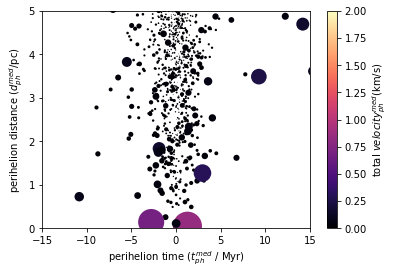

In [61]:
import matplotlib.pyplot as plt 
area = (y)/(d*vtot)
plt.scatter(t/10**6, d, s = 1000*area, alpha = 1, edgecolor = 'none', facecolor = 'none', c = area, vmin=0, vmax=2, cmap='magma')
cbartitle = plt.colorbar()
cbartitle.set_label('total $velocity^{med}_{ph}$(km/s)')
#plt.scatter(tph/10**3, dph, s = 500*area, alpha = .5, edgecolor = 'black', facecolor = 'black', marker = 'x')
xmin, xmax = plt.xlim(-15,15)
ymin, ymax = plt.ylim(0,5)
plt.xlabel("perihelion time ($t^{med}_{ph}$ / Myr)")
plt.ylabel("perihelion distance ($d^{med}_{ph}$/pc)")

In [48]:
sort = np.sort(vtan)

In [46]:
df = GSample_A.to_pandas()

In [49]:
for i in sort:
    print(np.where(vtan == i))

(array([184]),)
(array([154199]),)
(array([53168]),)
(array([63173]),)
(array([125376]),)
(array([84517]),)
(array([63594]),)
(array([138448]),)
(array([110382]),)
(array([10291]),)
(array([141648]),)
(array([99946]),)
(array([146969]),)
(array([93250]),)
(array([11535]),)
(array([22441]),)
(array([46216]),)
(array([53424]),)
(array([70899]),)
(array([63720]),)
(array([55475]),)
(array([147885]),)
(array([44202]),)
(array([73000]),)
(array([124781]),)
(array([796]),)
(array([70607]),)
(array([125743]),)
(array([126985]),)
(array([81120]),)
(array([96571]),)
(array([2088]),)
(array([19627]),)
(array([98036]),)
(array([3770]),)
(array([148426]),)
(array([26421]),)
(array([130536]),)
(array([11583]),)
(array([36797]),)
(array([69300]),)
(array([152773]),)
(array([116324]),)
(array([135328]),)
(array([37415]),)
(array([32565]),)
(array([143008]),)
(array([19238]),)
(array([8599]),)
(array([23294]),)
(array([141977]),)
(array([69437]),)
(array([5914]),)
(array([112544]),)
(array([121321]),)

In [57]:
df.columns
df['row_num'] = np.arange(len(df))
gj = df.loc[df['row_num'] == 154199]
gj

,source_id,designation,ra,dec,l,b,ecl_lon,ecl_lat,parallax,pmra,...,scan_direction_strength_k4,solution_id,teff_gspphot,teff_gspphot_lower,teff_gspphot_upper,vbroad,vbroad_error,vbroad_nb_transits,visibility_periods_used,row_num
154199,510911618569239040,Gaia DR3 510911618569239040,20.131652,61.882522,126.352323,-0.795894,48.472204,48.131828,13.211847,0.14411,...,NaN,1636148068921376768,5816.251465,5807.018555,5894.115723,7.023154,0.988656,12,28,154199


In [60]:
df.columns
df['row_num'] = np.arange(len(df))
gj = df.loc[df['row_num'] == 184]
gj

,source_id,designation,ra,dec,l,b,ecl_lon,ecl_lat,parallax,pmra,...,scan_direction_strength_k4,solution_id,teff_gspphot,teff_gspphot_lower,teff_gspphot_upper,vbroad,vbroad_error,vbroad_nb_transits,visibility_periods_used,row_num
184,4270814637616488064,Gaia DR3 4270814637616488064,274.961836,-1.938613,27.580825,6.130445,275.327568,21.408953,52.396292,-0.414064,...,NaN,1636148068921376768,NaN,NaN,NaN,NaN,NaN,-32768,15,184


In [76]:
source_id = np.asarray(GSample_A["source_id"])

area[np.argsort(-1*area)[0:10]]

array([0.8456904538129305 , 0.6800441098835832 , 0.38755177832761994,
       0.30917005546804993, 0.2451816882599446 , 0.16915942140888984,
       0.16640550310544236, 0.15602909524815953, 0.14028699801410494,
       0.11219797128036012])

In [77]:
source_id[np.argsort(-1*area)[0:10]]

array([4270814637616488064,  510911618569239040, 3297007356736766080,
       4454410779977796736, 6150582597406438016, 3448410657639298048,
       3215795435043618432, 1780298239507224832, 1337664063942689792,
       3448457932341125248])

In [79]:
source_id[np.argsort(d)[0:10]]

array([4270814637616488064, 5544743925212648320,  510911618569239040,
       5571232118090082816, 3372104035275483392,  929788371508812288,
       4116451378388951424, 1952802469918554368, 3054509410098672000,
       3600338081985998080])

In [68]:
phot_g_mean_mag = np.asarray(GSample_A["phot_g_mean_mag"])
phot_bp_mean_mag = np.asarray(GSample_A["phot_bp_mean_mag"])
phot_rp_mean_mag = np.asarray(GSample_A["phot_rp_mean_mag"])
parallax = np.asarray(GSample_A["parallax"])
Teff = np.asarray(GSample_A["parallax"])
bp_rp = phot_bp_mean_mag - phot_rp_mean_mag
abs_mag = phot_g_mean_mag + 5*(np.log10(parallax))

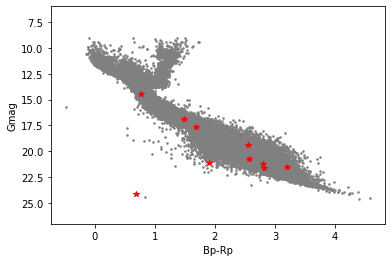

In [65]:
plt.plot(bp_rp,abs_mag,linestyle='None',marker='.',markersize=3,color='grey')
plt.ylim(27,6)
plt.ylabel('Gmag')
plt.xlabel('Bp-Rp')
plt.plot(bp_rp[np.argsort(d)[0:10]],abs_mag[np.argsort(d)[0:10]],color='red',linestyle='None',marker='*' )
plt.show()

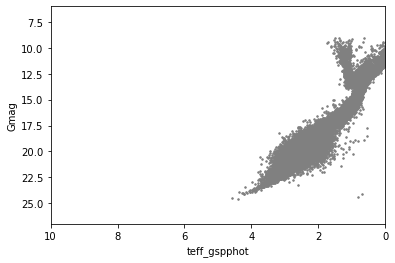

In [75]:
plt.plot(bp_rp,abs_mag,linestyle='None',marker='.',markersize=3,color='grey')
plt.ylim(27,6)
plt.ylabel('Gmag')
plt.xlabel('teff_gspphot')
xmin, xmax = plt.xlim(10,0)
plt.plot(Teff[np.argsort(d)[0:10]],abs_mag[np.argsort(d)[0:10]],color='red',linestyle='None',marker='*' )
plt.show()

In [ ]:
teff_gspphot